In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
import plotly.graph_objects as pgx
import pylab


from matplotlib import pyplot 
import matplotlib.pyplot as plt
import seaborn as sn

df = pd.read_csv("Train.csv")

df

,UserIP_Anonymized,Scenario,age,gender,education,political,religious,country_code,Outcome,Continent
0,0002ae2d,Footbridge,19,Women,College,0.56,0.00,GB,0,Europe
1,0002ae2d,Loop,19,Women,College,0.56,0.00,GB,1,Europe
2,0002ae2d,Switch,19,Women,College,0.56,0.00,GB,1,Europe
3,00065336,Footbridge,19,Men,College,0.00,0.68,FR,1,Europe
4,00065336,Loop,19,Men,College,0.00,0.68,FR,0,Europe
...,...,...,...,...,...,...,...,...,...,...
59154,ffef6123,Footbridge,27,Men,College,0.34,0.53,SG,0,Asia
59155,ffef6123,Loop,23,Men,College,1.00,0.00,SG,1,Asia
59156,ffef6123,Loop,27,Men,College,0.34,0.53,SG,1,Asia
59157,ffef6123,Switch,23,Men,College,1.00,0.00,SG,1,Asia


In [2]:
df.columns

Index(['UserIP_Anonymized', 'Scenario', 'age', 'gender', 'education',
       'political', 'religious', 'country_code', 'Outcome', 'Continent'],
      dtype='object')

In [75]:
sorted_religiuos = df.sort_values(by='religious')
sorted_religiuos["believer"] = "0" # non credente
sorted_religiuos.loc[(df["religious"] > 0) & (sorted_religiuos["religious"] < 0.4) , "believer"] = "(0; 0.4)" #poco credente
sorted_religiuos.loc[(df["religious"] >= 0.4) & (sorted_religiuos["religious"] < 0.7), "believer"] = "[0.4; 0.7)" #credente
sorted_religiuos.loc[df["religious"] >= 0.7, "believer"] = "[0.7; 1)" # molto credente
px.histogram(sorted_religiuos, x="believer")



In [76]:
sorted_political = df.sort_values(by='political') 
sorted_political["Political Activity"] = "0" # non attivo
sorted_political.loc[(df["political"] > 0) & (sorted_political["political"] < 0.4) , "Political Activity"] = "(0; 0.4)" #poco attivo
sorted_political.loc[(df["political"] >= 0.4) & (sorted_political["political"] < 0.7), "Political Activity"] = "[0.4; 0.7)" #attivo
sorted_political.loc[df["political"] >= 0.7, "Political Activity"] = "[0.7; 1)" #molto attivo
px.histogram(sorted_political, x="Political Activity")


In [5]:
maschi = df.loc[df["gender"] == "Men", :]
femmine = df.loc[df["gender"] == "Women", :]

print("numero di maschi: ", maschi["gender"].size)
print("numero di femmine: ", femmine["gender"].size)

numero di maschi:  44166
numero di femmine:  14993


In [6]:
df.groupby(["Continent","gender"]).size().unstack()

gender,Men,Women
Continent,,
Americas,12348,4892
Asia,5160,1559
Europe,25641,8163
Oc.,1017,379


In [7]:
df.groupby(["gender","education"]).size().unstack()

education,College,No College
gender,,
Men,32345,11821
Women,10747,4246


In [8]:
print("percentuale maschi college: ", ((maschi["education"] == "College").size / maschi["gender"].size) * 100, "%")
print("percentuale femmine college: ", (femmine["education"].size / femmine["gender"].size) * 100, "%")

percentuale maschi college:  100.0 %
percentuale femmine college:  100.0 %


In [9]:
dfYoung = df.loc[df["age"] < 35, ["age","Continent","country_code","Scenario","Outcome"]]
dfAdult =  df.loc[(df["age"] >= 35) & (df["age"] <= 60 ), ["age","Continent","country_code","Scenario","Outcome"]]
dfOld =  df.loc[df["age"] >= 60, ["age","Continent","Scenario","country_code","Outcome"]]
print(dfYoung)

dfYoung.groupby(["age","Scenario"]).size().unstack()
scenario = df["Scenario"] == "Footbridge"
fig = px.histogram(dfYoung, x="Outcome", color="Continent", barmode="group")
fig.layout["xaxis"]["title"] = "Tira la leva"
fig.layout["yaxis"]["title"] = "Numero di persone"
fig

       age Continent country_code    Scenario  Outcome
0       19    Europe           GB  Footbridge        0
1       19    Europe           GB        Loop        1
2       19    Europe           GB      Switch        1
3       19    Europe           FR  Footbridge        1
4       19    Europe           FR        Loop        0
...    ...       ...          ...         ...      ...
59154   27      Asia           SG  Footbridge        0
59155   23      Asia           SG        Loop        1
59156   27      Asia           SG        Loop        1
59157   23      Asia           SG      Switch        1
59158   27      Asia           SG      Switch        1

[47038 rows x 5 columns]


In [10]:
print(dfAdult)
dfAdult.groupby(["age","Scenario"]).size().unstack()
fig2 = px.histogram(dfAdult, x="Outcome", color="Continent", barmode="group")
fig2.layout["xaxis"]["title"] = "Tira la leva"
fig2


       age Continent country_code    Scenario  Outcome
20      35  Americas           US  Footbridge        0
21      35  Americas           US        Loop        1
22      35  Americas           US      Switch        1
43      47    Europe           FR  Footbridge        0
44      47    Europe           FR        Loop        1
...    ...       ...          ...         ...      ...
59111   56    Europe           FR        Loop        1
59112   56    Europe           FR      Switch        0
59150   40      Asia           IL  Footbridge        0
59151   40      Asia           IL        Loop        1
59152   40      Asia           IL      Switch        1

[11414 rows x 5 columns]


In [11]:
print(dfOld)

dfOld.groupby(["age","Scenario"]).size().unstack()
fig3 = px.histogram(dfOld, x="Outcome", color="Continent", barmode="group")
fig3.layout["xaxis"]["title"] = "Tira la leva"
fig3.layout["yaxis"]["title"] = "Numero di persone"
fig3

       age Continent    Scenario country_code  Outcome
127     62    Europe        Loop           BE        1
128     62    Europe      Switch           BE        1
204     60  Americas  Footbridge           US        0
205     60  Americas        Loop           US        1
206     60  Americas      Switch           US        1
...    ...       ...         ...          ...      ...
58431   64    Europe        Loop           RU        0
58432   64    Europe      Switch           RU        1
58905   60    Europe  Footbridge           FR        1
58906   60    Europe        Loop           FR        1
58907   60    Europe      Switch           FR        1

[868 rows x 5 columns]


# subplot

# barplot
## per età 

In [12]:
fig = px.histogram(dfYoung, 
                   orientation="v", 
                   x="age", 
                   color="Outcome", 
                   barmode="stack", 
                   barnorm='percent',
                   facet_col="Scenario",  
                   title="Omission VS. Commission by age range: young (<35)",
                   labels={"outcome_str": "Outcome"})

fig


In [13]:
fig1 = px.histogram(dfAdult, 
                   orientation="v", 
                   x="age", 
                   color="Outcome", 
                   barmode="stack", 
                   barnorm='percent',
                   facet_row="Scenario",  
                   title="Omission VS. Commission by age range: adult (>35 & <60)",
                   labels={"outcome_str": "Outcome"})

fig1


In [14]:
fig2 = px.histogram(dfOld, 
                   orientation="v", 
                   x="age", 
                   color="Outcome", 
                   barmode="stack", 
                   barnorm='percent',
                   facet_col="Scenario",  
                   title="Omission VS. Commission by age range: Old (>60)",
                   labels={"outcome_str": "Outcome"})

fig2

In [15]:
df["ageRange"] = "young"
df.loc[(df["age"] >= 35) & (df["age"] < 60) , "ageRange"] = "adult"
df.loc[df["age"] >= 60, "ageRange"] = "old"

df["outcomeString"] = df["Outcome"].map({0 : "Omission", 1: "Commission"})
df["outcomeString"]
fig3 = px.histogram(df, 
                   orientation="v", 
                   x="age", 
                   color="outcomeString", 
                   barmode="stack", 
                   barnorm='percent',
                   facet_row="Scenario",  
                   title="Outcome per age",
                   labels={"outcome_str": "Outcome"})


fig3

#provare a raggruppare le colonne in gruppi da 2-3 anni 

# tutti quelli che hanno tirato la leva guardando le età

In [16]:
df["loop"] = "no"
df.loc[df["Scenario"] == "Loop", "loop"] = "yes"

fig3 = px.histogram(df, 
                   orientation="v", 
                   x="age", 
                   color = "loop",
                   barmode="stack", 
                   barnorm='percent',
                   title="tutti quelli che hanno votato in base all'età Scenario = Loop",
                   labels={"outcome_str": "Outcome"})


fig3

In [17]:
df["switch"] = "no"
df.loc[df["Scenario"] == "Switch", "switch"] = "yes"

fig3 = px.histogram(df, 
                   orientation="v", 
                   x="age", 
                   color = "switch",
                   barmode="stack", 
                   barnorm='percent',
                   title="tutti quelli che hanno votato in base all'età Scenario = Switch",
                   labels={"outcome_str": "Outcome"})


fig3

In [18]:
df["Footbridge"] = "no"
df.loc[df["Scenario"] == "Footbridge", "Footbridge"] = "yes"

fig3 = px.histogram(df, 
                   orientation="v", 
                   x="age", 
                   color = "Footbridge",
                   barmode="stack", 
                   barnorm='percent',
                   title="tutti quelli che hanno votato in base all'età Scenario = Footbridge",
                   labels={"outcome_str": "Outcome"})


fig3

# Altri grafici

In [19]:
fig = px.histogram(dfYoung, 
                   orientation="h", 
                   y="Continent", 
                   color="Outcome", 
                   barmode="stack", 
                   facet_col="Scenario",  
                   title="Omission VS. Commission by Continent and Age less then 35",
                   labels={"outcome_str": "Outcome"})

fig

In [20]:
fig = px.histogram(dfAdult, 
                   orientation="h", 
                   y="Continent", 
                   color="Outcome", 
                   barmode="stack", 
                   facet_col="Scenario",  
                   title="Omission VS. Commission by Continent and Age between 35 and 60",
                   labels={"outcome_str": "Outcome"})

fig

In [21]:
fig = px.histogram(dfOld, 
                   orientation="h", 
                   y="Continent", 
                   color="Outcome", 
                   barmode="stack", 
                   facet_col="Scenario",  
                   title="Omission VS. Commission by Continent and Age more then 60",
                   labels={"outcome_str": "Outcome"})

fig

# Quelli che hanno fatto il college e hanno tirato la leva

In [22]:
df["college"] = "no college"
df.loc[df["education"] == "College", "college"] = "si college"
df["intervento"] = "non intervenuto"
df.loc[df["Outcome"] == 1, "intervento"] = "intervenuto"

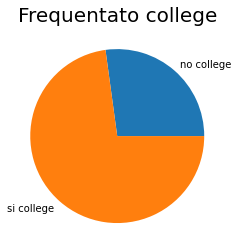

In [23]:
size = df.groupby("college").size()
size.plot(kind='pie')
pylab.title("Frequentato college", fontsize=20)
pylab.xlabel("")
pylab.ylabel("")
pylab.show()


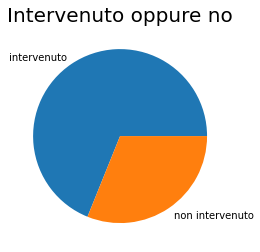

In [24]:
size = df.groupby("intervento").size()
size.plot(kind='pie')
pylab.title("Intervenuto oppure no", fontsize=20)
pylab.xlabel("")
pylab.ylabel("")
pylab.show()

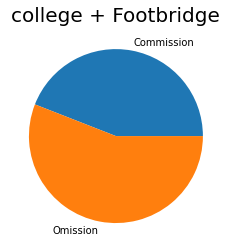

In [25]:
dfCollegeFootbridge = df.loc[(df["education"] == "College") & (df["Scenario"] == "Footbridge"), ["outcomeString"]]
pylab.title("college + Footbridge", fontsize=20)
size = dfCollegeFootbridge.groupby("outcomeString").size()
size.plot(kind='pie')
pylab.xlabel("")
pylab.ylabel("")
pylab.show()


In [67]:
dfCollegeFootbridge = df.loc[(df["education"] == "College") & (df["Scenario"] == "Footbridge"), ["outcomeString"]] 
fig = px.pie(dfCollegeFootbridge,
             names='outcomeString',
             title="College + Footbridge",
             color_discrete_sequence=['#1f77b4','indianred'])
fig.show()

In [46]:
dfNoCollegeFootbridge = df.loc[(df["education"] != "College") & (df["Scenario"] == "Footbridge"), ["outcomeString"]]

fig = px.pie(dfNoCollegeFootbridge,
             names='outcomeString',
             title="No College + Footbridge",
             color_discrete_sequence=['indianred', '#1f77b4'])
fig.show()

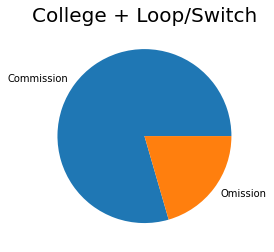

In [47]:
dfCollegeLoop = df.loc[(df["education"] == "College") & (df["Scenario"] != "Footbridge"), ["outcomeString"]]
pylab.title("College + Loop/Switch", fontsize=20)
size = dfCollegeLoop.groupby("outcomeString").size()
size.plot(kind='pie')
pylab.xlabel("")
pylab.ylabel("")
pylab.show()


In [48]:
fig = px.pie(dfCollegeLoop,
             names='outcomeString',
             title="College + Loop/Switch",
             color_discrete_sequence=['indianred', '#1f77b4'])
fig.show()

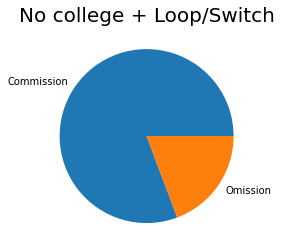

In [49]:
dfNoCollegeLoop = df.loc[(df["education"] == "No College") & (df["Scenario"] != "Footbridge"), ["outcomeString"]]
pylab.title("No college + Loop/Switch", fontsize=20)
size = dfNoCollegeLoop.groupby("outcomeString").size()
size.plot(kind='pie')
pylab.xlabel("")
pylab.ylabel("")
pylab.show()

In [50]:
fig = px.pie(dfNoCollegeLoop,
             names='outcomeString',
             title="No college + Loop/Switch",
             color_discrete_sequence=['indianred', '#1f77b4'])
fig.show()

In [ ]:
fig = px.histogram(df, 
                   orientation="v", 
                   x="age", 
                   color="Outcome", 
                   barmode="stack", 
                   barnorm='fraction',
                   facet_row="Scenario",  
                   title="",
                   nbins=20, 
                   labels={"outcomeString": "Outcome"})

fig